# Predicting Energy Dynamics: Integrating Hourly Weather and Power Data for Energy Price Forecasting in Spain


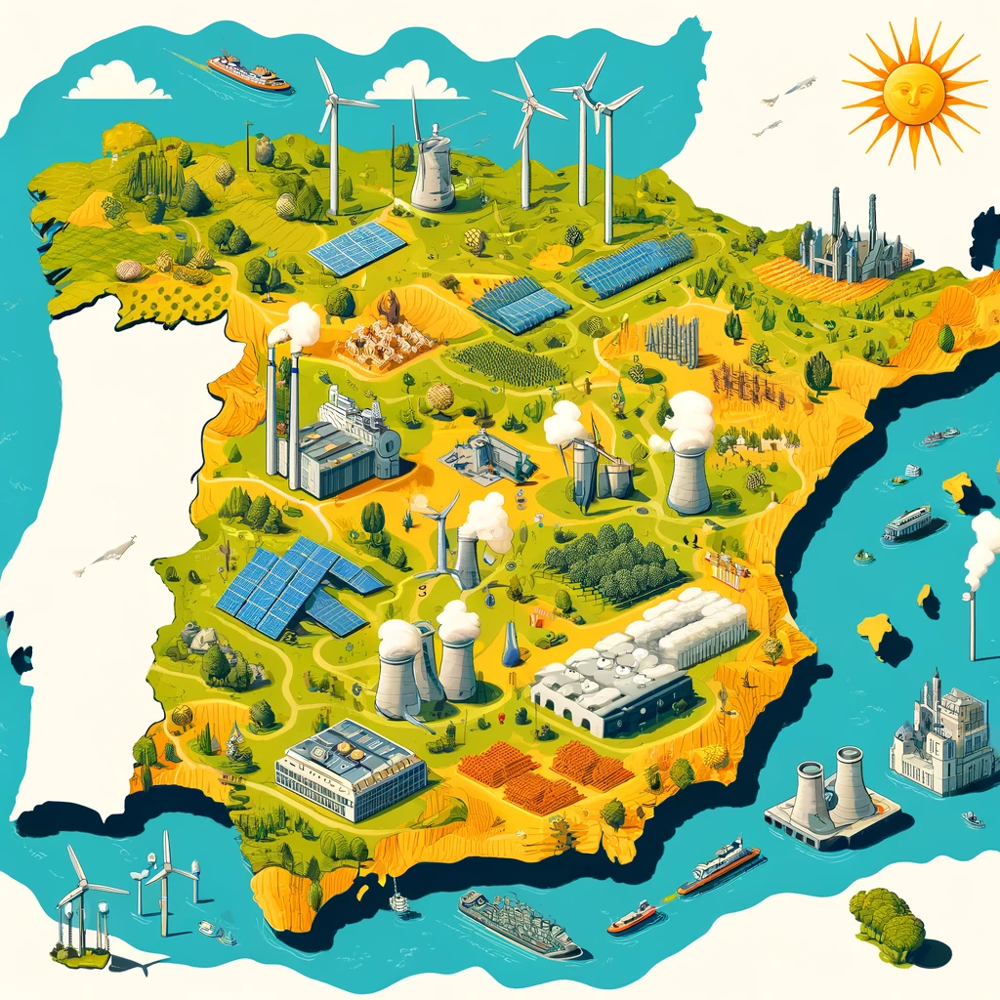

###**Team Members:**
Rayan Kabaha - rkabaha@seas.upenn.edu

Sundeep Singh - sundeeps@seas.upenn.edu

Yu-Cheng Ku - yku@seas.upenn.edu

<br>

Roles: We split the work evenly and worked collaboratively on all parts of the project.

<br>

####**Project Goals:**

1. Analyze the trend of clean energy generation.
2. Model and forecast energy prices using various regression techniques. Initially, we aimed to compare our forecast accuracy with ENTSOE's, but later decided to conduct a comprehensive comparative study across different models. Since the target variable (price) is continuous, we will employ regression techniques such as linear regression, Random Forest regression (bagging), and Gradient Boosting regression (boosting).
3. Fit an ARIMA model to understand the temporal patterns and dependencies in energy price data.

<br>

####**The Models:**

OLS linear regression, Random Forest regression, Gradient Boosting regression, and ARIMA.

<br>

####**Significance:**

Accurate energy price forecasting is crucial for efficient resource management and cost optimization. This project analyzes how factors like energy production, weather conditions, time patterns, and historical prices influence energy costs in Spain.
By comparatively evaluating different machine learning models, we identified the most effective techniques for this complex prediction task. The insights gained will inform future pricing strategies for consumers and industry stakeholders. As the world transitions towards sustainable energy, understanding the forces that shape energy prices is vital for guiding policy decisions and resource allocation.

<br>

####**Structure of the Deliverable:**

Section 1 shows the data preparation and explorative data analysis (EDA). Section 2 presents the modeling and prediction of the energy price. The comparative study among three considered regression techniques (OLS, random forests and gradient boosting machines) is detailed. In Section 3, we developed an ARIMA model to take into account the intertemporal dependence that was observed in the data. The findings are summarized in Section 4.

Moreover, Section 5 discusses the challenges we faced during the project, and Section 6 lists some potential future directions.  

#**0. Installations and Imports**

In [ ]:
import pandas as pd
import numpy as np
from sklearn import linear_model
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns
from datetime import datetime
import seaborn as sns
import plotly.graph_objects as go
from google.colab import drive
import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.impute import SimpleImputer

In [ ]:
# Run this cell to mount the google drive (will be prompted to sign in)

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## implement paths
energy_path = '/content/drive/MyDrive/CIS545_Final_Project/energy_dataset.csv'
weather_path = '/content/drive/MyDrive/CIS545_Final_Project/weather_features.csv'

Load our dataset into a Pandas Dataframe using Pandas's read_csv functionality

In [ ]:
# Read the csv files and save them to their unique dataframes

df_energy = pd.read_csv(energy_path)
df_weather = pd.read_csv(weather_path)

#**1. Explorative Data Analysis**


####**Data Source:** https://www.kaggle.com/datasets/nicholasjhana/energy-consumption-generation-prices-and-weather/data

<br>

#### About the Data:

This project utilizes two CSV files containing hourly electricity generation and weather data for Spain from 2015 to 2019 (a four-year period). Specifically:

* `weather_features.csv`: Provides hourly weather conditions (temperature, wind speed, humidity, rainfall, and qualitative descriptions) for five major Spanish cities: Madrid, Barcelona, Valencia, Seville, and Bilbao.

* `energy_dataset.csv`: Contains hourly information on energy generation in Spain, including the output (in MW) from various sources (such as fossil fuel, hydro, etc.), as well as the total national energy demand and the energy price (€/MWh).

*Note: Since the generation of each energy type is in MW, and the time-series data is hourly, each cell value represents MWh (Megawatt-hours).*


<br>







##**1.1 Energy Data**

This section will deal with cleaning and properly formatting the energy dataframe, df_energy.

#### Structure:


* `time`: Timestamp for the hourly data (object)

* `generation biomass`: Amount of energy generated from biomass sources (float64)

* `generation fossil brown coal/lignite`: Amount of energy generated from brown coal/lignite fossil fuels (float64)

* `generation fossil coal-derived gas`: Amount of energy generated from coal-derived gas fossil fuels (float64)

* `generation fossil gas`: Amount of energy generated from fossil gas (float64)
* generation fossil hard coal: Amount of energy generated from hard coal fossil fuels (float64)

* `generation fossil oil`: Amount of energy generated from fossil oil (float64)

* `generation fossil oil shale`: Amount of energy generated from fossil oil shale (float64)

* `generation fossil peat`: Amount of energy generated from fossil peat (float64)

* `generation geothermal:` Amount of energy generated from geothermal sources (float64)

* `generation hydro pumped storage aggregated`: Aggregated amount of energy generated from hydro pumped storage (float64)

* `generation hydro pumped storage consumption`: Amount of energy consumed by hydro pumped storage (float64)

* `generation hydro run-of-river and poundage`: Amount of energy generated from run-of-river and poundage hydro sources (float64)
* generation hydro water reservoir: Amount of energy generated from hydro water reservoirs (float64)

* `generation marine`: Amount of energy generated from marine sources (float64)

* `generation nuclear`: Amount of energy generated from nuclear sources (float64)

* `generation other`: Amount of energy generated from other sources (float64)

* `generation other renewable`: Amount of energy generated from other renewable sources (float64)

* `generation solar`: Amount of energy generated from solar sources (float64)

* `generation waste`: Amount of energy generated from waste sources (float64)

* `generation wind offshore`: Amount of energy generated from offshore wind sources (float64)

* `generation wind onshore`: Amount of energy generated from onshore wind sources (float64)

* `forecast solar day ahead`: Day-ahead forecast for solar energy generation (float64)

* `forecast wind offshore eday ahead`: Day-ahead forecast for offshore wind energy generation (float64)

* `forecast wind onshore day ahead`: Day-ahead forecast for onshore wind energy generation (float64)

* `total load forecast`: Forecasted total energy load (demand) (float64)

* `total load actual`: Actual total energy load (demand) (float64)

* `price day ahead`: Day-ahead forecasted energy price (float64)

* `price actual`: Actual energy price (float64)

In [ ]:
#####################
# EDA for Energy DF #
#####################
df_energy.head() # energy df are all numeric

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


In [ ]:
# Drop 'generation hydro pumped storage aggregated' and 'forecast wind offshore eday ahead'
df_energy = df_energy.drop(columns = ['generation hydro pumped storage aggregated','forecast wind offshore eday ahead'])

# Use .count() to obtain the number of non-NaN values in each column
# The remaining columns have only 35064 - 35017 = 47 missing values
df_energy.count()

# Given the very small number of missings, we simply drop the rows with NAs
df_energy = df_energy.dropna()
df_energy.shape                # (35017, 27)

# delete duplicate rows
df_energy = df_energy.drop_duplicates()
df_energy.shape                # No duplicate rows, (35017, 27)
df_energy.describe()

# From the descriptive stats results, we found there are several columns with only 0 as the values
# remove those all-0 columns
df_energy = df_energy.drop(columns = ['generation fossil coal-derived gas',
                                      'generation fossil oil shale',
                                      'generation fossil peat',
                                      'generation geothermal',
                                      'generation marine',
                                      'generation wind offshore'])
# Total load is energy consumption

#######################
# Energy DF Done here #
#######################
# Energy dataframe has shape of (35017, 21)
df_energy.shape

(35017, 21)

In [ ]:
# Let's see what generation are included
pd.Series(df_energy.columns[df_energy.columns.str.contains('generation')]).str.replace('generation ', '')

# fossil brown coal/lignite, fossil gas, fossil hard coal, fossil oil are not clean
time_dt = df_energy["time"].str.split("+", expand=True)[0]
df_energy['time_dt'] = pd.to_datetime(time_dt,format='%Y-%m-%d %H:%M:%S')
df_energy['time_dt'].head()

# Obtain all the date information
df_energy['year']      = df_energy['time_dt'].dt.year
#df_energy['year'].value_counts()
df_energy['qtr']       = df_energy['time_dt'].dt.quarter
# df_energy['qtr'].value_counts()
df_energy['month']     = df_energy['time_dt'].dt.month
# df_energy['month'].value_counts()
df_energy['week']      = df_energy['time_dt'].apply(lambda x: pd.Timestamp(x).week)
# df_energy['week'].value_counts()
df_energy['hour']      = df_energy['time_dt'].dt.hour
#df_energy['hour'].value_counts()
df_energy['dayofweek'] = df_energy['time_dt'].dt.dayofweek
#df_energy['dayofweek'].value_counts()
df_energy['dayofmonth']= df_energy['time_dt'].dt.day
#df_energy['dayofmonth'].value_counts()
df_energy['qtr_date'] = df_energy['year'].astype('str') + 'Q' + df_energy['qtr'].astype('str')
# df_energy['qtr_date'].value_counts()
df_energy['mon_date'] = df_energy['time'].str.slice(start = 0, stop = 7)
#df_energy['mon_date'].value_counts()


###**1.2 Study on Clean Energy Trend**

This section will:

1.   Prepare for and provide visualilizations for the clean energy types in df_energy, showcasing the variations in their generation and trends.
2.   Study the clean energy trend by aggregation and calculate the share of clean energy in percentage (clean_pct)
3.   Downsample by taking quarterly average of clean_pct
4.   Plot the price of energy by using two downsample methods, the rolling window and average over a time interval
5. Check the distribution of each energy generations and see if we need to take log transformation




In [ ]:
##############################################################
# First goal: Study the trend of the clean energy generation #
##############################################################

## First, we study the time trend of each type of generation based on monthly average
import matplotlib.pyplot as plt

generations = df_energy[df_energy.columns[list(df_energy.columns.str.contains('generation'))]]
generations.columns = generations.columns[generations.columns.str.contains('generation')].str.replace('generation ', '')

generations.describe()

# We will exclude 'generation other' and 'generation other renewable' because their average are really small (< 100, Fossil Gas > 5600)

,biomass,fossil brown coal/lignite,fossil gas,fossil hard coal,fossil oil,hydro pumped storage consumption,hydro run-of-river and poundage,hydro water reservoir,nuclear,other,other renewable,solar,waste,wind onshore
count,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000,35017.000000
mean,383.529800,448.103207,5622.411829,4255.571694,298.333095,475.726047,972.090956,2604.536168,6264.056687,60.237256,85.651141,1433.093669,269.501299,5466.078048
std,85.304489,354.605379,2202.018147,1961.428697,52.470724,792.553651,400.753545,1834.944644,838.260925,20.236345,14.063909,1680.331016,50.143711,3213.624333
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,333.000000,0.000000,4126.000000,2527.000000,263.000000,0.000000,637.000000,1077.000000,5760.000000,53.000000,74.000000,71.000000,240.000000,2935.000000
50%,367.000000,509.000000,4968.000000,4473.000000,300.000000,68.000000,906.000000,2164.000000,6564.000000,57.000000,88.000000,616.000000,279.000000,4850.000000
75%,433.000000,757.000000,6428.000000,5837.000000,330.000000,616.000000,1250.000000,3755.000000,7024.000000,80.000000,97.000000,2579.000000,310.000000,7399.000000
max,592.000000,999.000000,20034.000000,8359.000000,449.000000,4523.000000,2000.000000,9728.000000,7117.000000,106.000000,119.000000,5792.000000,357.000000,17436.000000


In [ ]:
# Rename the columns --> remove 'generation'
# Drop 'generation other' and 'generation other renewable' only for visualization purpose
generations_mon = pd.concat([df_energy['mon_date'], generations], axis = 1)
generations_mon = generations_mon.groupby(by = 'mon_date').mean()
generations_mon = generations_mon.drop(columns = ['other', 'other renewable'])

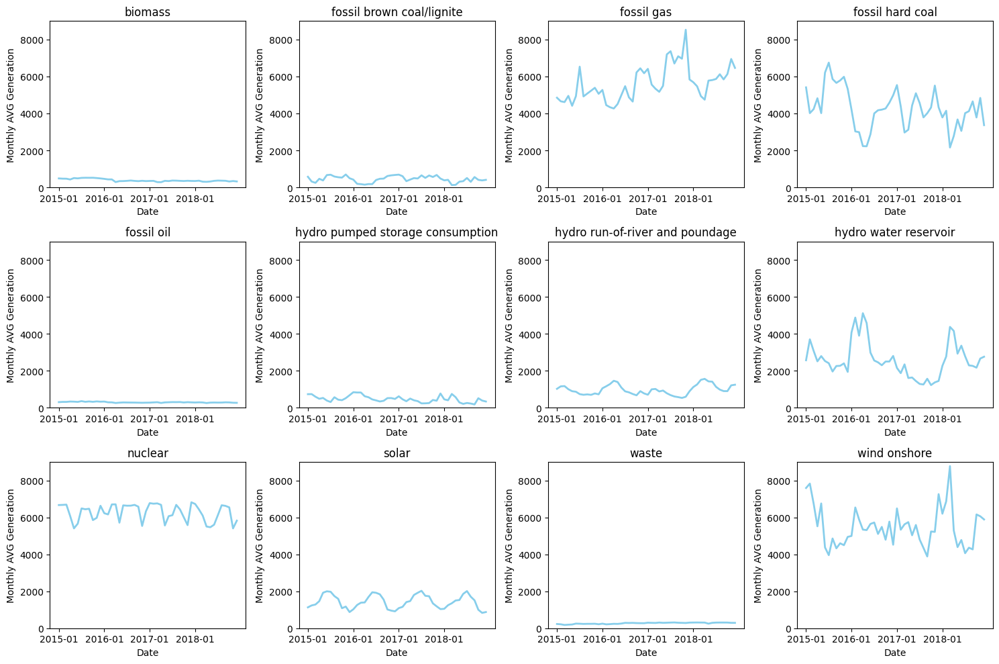

In [ ]:
# Produce time-series plots for each generation
# Original data are too volatile. Downsample by taking monthly average
# Create a 3x4 subplot layout
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15, 10))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each column in the dataframe and create a plot for each one
for i, col in enumerate(generations_mon.columns):
    axes[i].plot(generations_mon[col], label=f'{col}', marker='', color='skyblue', linewidth=2)
    axes[i].set_title(f'{col}')
    axes[i].set_xticks([0, 12, 24, 36])
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('Monthly AVG Generation')
    axes[i].set_ylim([0, 9000])

# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()



Based on the above plots charting monthly average generation vs time per energy source, we can make a few conclusions about our data:


1. clean energy: biomass, hydro pumped storage comsumption, are decreasing
2. clean energy: waste is increasing
3. clean energy: hydro run-of-river, hydro water reservoir, nuclear, solar, wind onshore are mean stable. Solar and nuclear have clear seasonality
4. non-clean energy: fossil hard coal, fossil oil are decreasing
5. non-clean energy: fossil gas is increasing
6. non-clean energy: fossil brown coil is mean stable

Overall, we cannot determine whether the clean energies aggregated has a trend.

<br>

To help further visualize our energy data, we will next plot the percent energy contribution of each energy source in a pie chart.



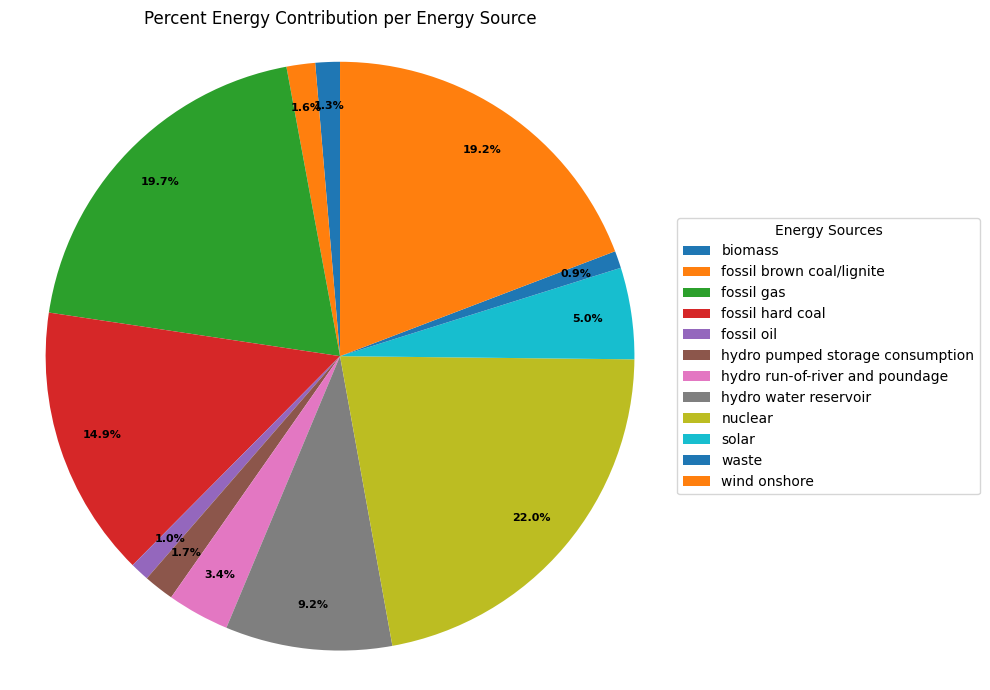

In [ ]:
import matplotlib.pyplot as plt

# sum of average contribution per energy source
energy_totals = generations_mon.sum()

# pie chart
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts, autotexts = ax.pie(
    energy_totals,
    autopct='%1.1f%%',
    startangle=90,
    pctdistance=0.85
)


# formatting
plt.setp(texts, size=8)
plt.setp(autotexts, size=8, weight="bold")
ax.axis('equal')
ax.set_title('Percent Energy Contribution per Energy Source')
ax.legend(wedges, energy_totals.index, title="Energy Sources", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.tight_layout()
plt.show()



Based on the pie chart above, we can determine that there are a few very important energy resources that contribute a significant percentage to the overall energy yield.

Namely, the four energy sources with the highest contribitions are:

1. Nuclear (22.0%)
2. Fossil Gas (19.7%)
3. Wind Onshore (19.2%)
4. Fossil Hard Coal (14.9%)


<br>

Given the significant contribution of these energy sources to Spain's total energy output, it is reasonable to speculate that they will have a greater influence on energy prices.

<ipython-input-12-4ee8f0c28430>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.set_xticklabels(plt.get_xticklabels(), rotation=90)


(50.0, 80.0)

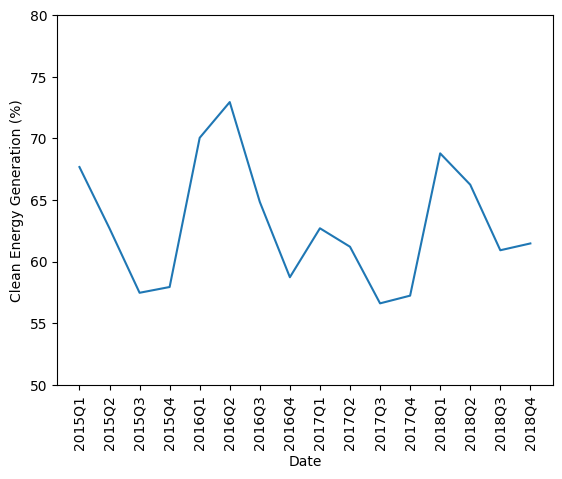

In [ ]:
##############################################################
# Study the clean energy trend by aggregation and downsample #
##############################################################

# Non-clean energy = sum of all generations that involve 'fossil'
# Clean energy = sum of all generations other than non-clean energies (including 'other' and 'other renewable')
# The calculate the share of clean energy in percentage; this is a new feature called 'clean_pct'
# Downsample by taking quarterly average of clean_pct
df_energy['non-clean'] = df_energy[list(df_energy.columns[df_energy.columns.str.contains('fossil')])].sum(axis = 1)
df_energy['clean'] = df_energy[list(df_energy.columns[~df_energy.columns.str.contains('fossil') & df_energy.columns.str.contains('generation')])].sum(axis = 1)
df_energy['clean_pct'] = 100 * df_energy['clean']/(df_energy['clean'] + df_energy['non-clean'])

clean_pct_qtr_avg = df_energy.groupby(by = 'qtr_date').mean(['clean_pct'])['clean_pct']
clean_pct_qtr_avg = clean_pct_qtr_avg.reset_index()
clean_pct_qtr_avg.columns = ['Date', 'Clean_Pct']

plt = sns.lineplot(data = clean_pct_qtr_avg, x = 'Date', y = 'Clean_Pct', markers=True, dashes=False)
plt.set(ylabel = 'Clean Energy Generation (%)', xlabel = 'Date')
plt.set_xticklabels(plt.get_xticklabels(), rotation=90)
plt.set_ylim(50, 80)

## For our first study goal
## Conclusion: we did not observe a clear trend for clean_pct against time

#### Conclusions From First Study (Clean Energy & Contributions):
* clean energy: biomass, hydro pumped storage comsumption, are decreasing
* clean energy: waste is increasing
* clean energy: hydro run-of-river, hydro water reservoir, nuclear, solar, wind onshore are mean stable. Solar and nuclear have clear seasonality
* non-clean energy: fossil hard coal, fossil oil are decreasing
* non-clean energy: fossil gas is increasing
* non-clean energy: fossil brown coil is mean stable

<br>

##### **The analysis of the data does not reveal a definitive trend for the total clean energy production over time. Similarly, the percentage contribution from clean energy sources (clean_pct) does not exhibit a clear pattern when plotted against time. However, it is evident that certain energy sources contribute a significantly higher proportion compared to others, with a few sources being the predominant contributors to the overall energy mix. We then can reasonably assume that these higher contributors will have a greater impact in our model for price prediction.**

In [ ]:
##########################################
# Second goal: Modeling the Price Actual #
##########################################
## First, we take a look of the trend for the price actual
# Using two downsample methods to smooth out the original series: 1. rolling window, 2. average over a time interval
# Try Line Plot with go.Scatter
# Downsample by taking monthly average
# Energy price appears to have strong seasonality

actl_price_mon_avg = df_energy.groupby(by = 'mon_date').mean(['price actual'])['price actual']
actl_price_mon_avg = actl_price_mon_avg.reset_index()
actl_price_mon_avg.columns = ['Date', 'Actl_Price_AVG']

fig2 = go.Figure()
fig2.add_trace(go.Line(x = df_energy['time_dt'], y = df_energy['price actual'], name = 'price actual'))
fig2.add_trace(go.Line(x = df_energy['time_dt'], y = df_energy['price actual'].rolling(window=168).mean(), name= 'rolling avg, window = Week'))
fig2.add_trace(go.Line(x = df_energy['time_dt'], y = df_energy['price actual'].rolling(window=720).mean(), name= 'rolling avg, window = Month'))
fig2.add_trace(go.Line(x = actl_price_mon_avg['Date'], y = actl_price_mon_avg['Actl_Price_AVG'], name='Monthly AVG', line = dict(color='yellow')))
fig2.show()

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




As we can see in the actual price against time chart above, there appears to be a strong seasonality to energy price, increasing in the winter months and decreasing in the warmer weather.

Out of curiosity, we noticed that January 2017 had a very high peak in price data. Upon further research we saw that:

>  In all months of 2017, but December, the monthly average price was higher than the same month of 2016. The largest year-on-year differences were in January, 34.96 €/MWh more than January 2016, because of the increase of the production due to the electricity exports to France. [Source](https://aleasoft.com/analysis-spanish-electricity-market-2017/#:~:text=In%20all%20months%20of%202017,the%20electricity%20exports%20to%20France.)






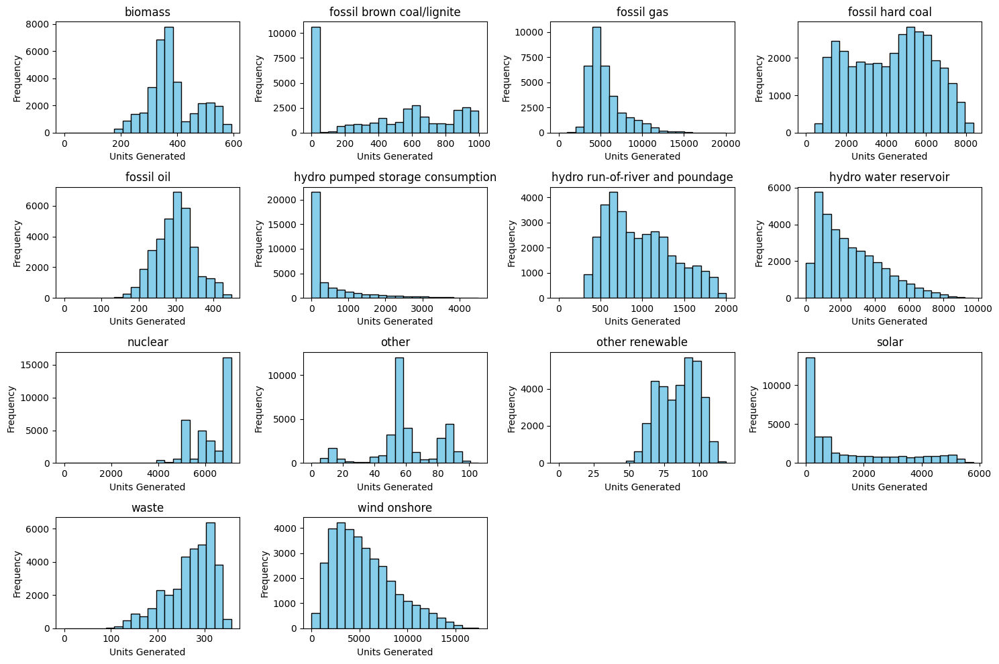

In [ ]:
# Check the distribution of each energy generations
# See if we need to take log transformation
# Turns out not ideal, because many contains 0
# Another way to generate the subplots

import matplotlib.pyplot as plt

plt.figure(figsize=(15,10))     # set dimensions of the figure
for i in range(0,14):
    plt.subplot(4,4, i+1)       # create subplots on a grid with 4 rows and 4 columns
    plt.hist(generations.iloc[:,i], bins=20, color='skyblue', edgecolor='black')
    plt.title(generations.columns[i])
    plt.ylabel('Frequency')
    plt.xlabel('Units Generated')
plt.tight_layout()
plt.show()

## Conclusion:
## We may not want to take log transformation on X even there are several features with skewed distribution because many of them contain value 0

#### Conclusion of Second Study: ##

We may not want to apply log transformation on the features (X) even though several of them have skewed distributions. This is because many of these features contain zero values, and the log of zero is undefined. Therefore, it is advisable to avoid log transformation on the entire feature set (X) to prevent introducing undefined values or errors in the model.

##**1.3 Weather Data**

This section will:

1.   Clean and properly format the weather dataframe, df_weather
2.   Study the categorical attributes of the weather dataframe
3.   Plot the cities and their respective weather conditions
4.   Merge the energy and weather dataframes to obtain the grand dataframe
5.   Compare weather features (such as snowfall and wind speed) among cities
6.   Check the distributions and provide visualitzations of the weather features

<br>

The structure for the weather DataFrame is as follows:

* `dt_iso`: Date and time in ISO format for each record (object).
* `city_name`: Name of the city where weather data was recorded (object).
* `temp`: Temperature in Celsius at the recorded time (float64).
* `temp_min`: Minimum temperature in Celsius recorded at the time (float64).
* `temp_max`: Maximum temperature in Celsius recorded at the time (float64).
* `pressure`: Atmospheric pressure in hPa at the recorded time (int64).
* `humidity`: Humidity percentage at the recorded time (int64).
* `wind_speed`: Wind speed in meter/sec at the recorded time (int64).
* `wind_deg`: Wind direction in degrees at the recorded time (int64).
* `rain_1h`: Rainfall in mm accumulated in the last hour (float64).
* `rain_3h`: Rainfall in mm accumulated in the last three hours (float64).
* `snow_3h`: Snowfall in mm accumulated in the last three hours (float64).
* `weather_id`: Weather condition ID that categorizes the weather (int64).
* `weather_main`: General description of the weather (e.g., Rain, Snow) (object).

* `weather_description`: Detailed weather condition description at the recorded
time (object).

* `weather_icon`: Icon code representing the weather condition visually (object).

In [ ]:
# Now, checking the weather related features

df_weather['city_name'].unique() # Which five cities?: ' Barcelona' has a leading space
df_weather['city_name'] = df_weather['city_name'].replace(' Barcelona', 'Barcelona') # Replace ' Barcelona' with 'Barcelona'


df_weather.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [ ]:
df_weather = df_weather.drop_duplicates()
df_weather.shape # (178375, 17) so, there are 178396 - 178375 = 21 duplicates

(178375, 17)

In [ ]:
# Study of the categorical attributes
df_weather['weather_icon'].value_counts()
df_weather['weather_id'].value_counts() # 'weather_id' is number labeled version of 'weather_description'
df_weather['weather_description'].value_counts()
df_weather['weather_main'].value_counts()
## 'weather_main' is a aggregate version of 'weather_description', less granular
## For example, clouds in 'weather_main' = 'few clouds' + 'broken clouds' + 'scattered clouds' + 'overcast clouds' in 'weather_description

## After the study, we decided to drop the categorical attributes for two reasons
## 1. It will cause duplicated rows. Within an hour, there can be multiple weather_main, for example, for Madrid, 2018-04-29 10:00:00+02:00, there are two weathers: 'drizzle' and 'mist'
## 2. The numerical measures have contained such weather information.

weather_main
clear           82670
clouds          68050
rain            17390
mist             3908
fog              2506
drizzle          1724
thunderstorm     1041
haze              435
dust              347
snow              270
smoke              33
squall              1
Name: count, dtype: int64

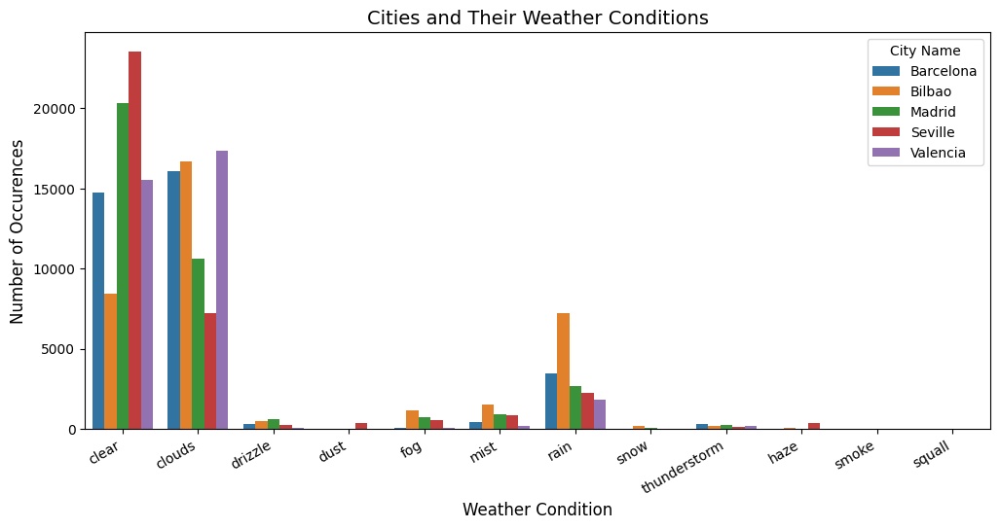

In [ ]:
#############################################################
## Plotting cities and their respective weather conditions ##
#############################################################
grouped_df = df_weather.groupby(['city_name', 'weather_main']).size()
grouped_df = grouped_df.reset_index(name = 'Count')

f, ax = plt.subplots(figsize=(12, 6))
sns.barplot(data = grouped_df, x = 'weather_main', y = 'Count', hue = 'city_name',  legend = 'auto', ax = ax)

#setting labels for the axis and title
plt.title(label = 'Cities and Their Weather Conditions', fontsize = 14)
plt.xlabel(xlabel = 'Weather Condition', fontsize = 12)
plt.ylabel(ylabel = 'Number of Occurences', fontsize = 12)
plt.legend(title = 'City Name')

#organizing the x axis key
plt.gcf().autofmt_xdate()

plt.show()


The chart illustrates the variation in weather conditions across the five cities under consideration. To account for these disparities and obtain a representative measure, we compute the average weather conditions across all five locations.

In [ ]:
## Drop categorical features
df_weather = df_weather.drop(columns = ['weather_icon', 'weather_id', 'weather_description', 'weather_main'])

In [ ]:
# Check if there are all-0 columns: NO
df_weather.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0


In [ ]:
df_weather = df_weather.drop_duplicates()
df_weather.shape # (175320, 17) so, there are 178396 - 175320 = 3076 duplicates due to multiple weather_main within the same hour

(175320, 13)

Time to Merge:

Now that our weather and energy DataFrames are correctly formatted and cleaned. We will merge them. The next few cell blocks document this process and proceed with further cleaning of the data.

In [ ]:
## Merge energy and weather dataframes to obtain the grand dataframe
## The merged df has 175320 > 50k rows
grand_df = df_energy.merge(df_weather, left_on = 'time', right_on = 'dt_iso', how = 'right')
grand_df.shape

(175320, 47)

In [ ]:
# In fact, the number of dates differs between the energy df and the weather df
print('# missings in time: ' + str(sum(grand_df['time'].isnull())))
print('# missings in time: ' + str(sum(grand_df['dt_iso'].isnull())))

# missings in time: 235
# missings in time: 0


In [ ]:
# Further remove the rows of missing 'time'
##################################################################
# This is the final clean dataframe, which has 175085 > 50k rows #
##################################################################

grand_df = grand_df.drop(grand_df[grand_df['time'].isnull() == True].index)
grand_df.shape

(175085, 47)

In [ ]:
## The energy features are the same across all cities
## So, let's compare the weather features among the cities
## We can see that the weather condition varies significantly among the cities. For example, Bilbao is much more cloudy than Seville. Its rain_3h is 10 times of Seville
grand_df[['city_name', 'temp', 'temp_min', 'temp_max', 'pressure', 'humidity', 'wind_speed', 'wind_deg', 'rain_1h', 'rain_3h', 'snow_3h', 'clouds_all']].groupby(by = 'city_name').mean()

,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all
city_name,,,,,,,,,,,
Barcelona,289.870839,288.618166,291.043680,1287.578947,73.842562,2.782763,187.661079,0.108590,0.000331,0.000000,22.709598
Bilbao,286.450213,284.995696,288.098400,1017.485650,78.720450,1.958734,159.839107,0.118434,0.001057,0.023872,43.425222
Madrid,288.283482,287.057227,289.379093,1011.813776,58.720479,2.432933,173.335751,0.043308,0.000133,0.000030,20.663563
Seville,293.172864,291.264639,296.009791,1018.530514,63.771026,2.483108,151.856870,0.041071,0.000182,0.000000,14.153782
Valencia,290.790688,290.232300,291.364667,1015.987121,65.095868,2.692407,160.739041,0.034479,0.000226,0.000154,20.747066


In [ ]:
# Keep the 'time_dt' as dates for visualization purpose
dates = df_energy['time_dt']
dates = dates.reset_index(drop=True)
print(len(dates))

35017


In [ ]:
## We can see that the weather condition varies significantly among the cities
## Due to the in-homogeneity, we will average the weather features over city
df_final = grand_df.groupby(by = 'time').mean(['temp', 'temp_min', 'temp_max', 'pressure', 'humidity', 'wind_speed', 'wind_deg', 'rain_1h', 'rain_3h', 'snow_3h', 'clouds_all'])
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35017 entries, 2015-01-01 00:00:00+01:00 to 2018-12-31 23:00:00+01:00
Data columns (total 41 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   generation biomass                           35017 non-null  float64
 1   generation fossil brown coal/lignite         35017 non-null  float64
 2   generation fossil gas                        35017 non-null  float64
 3   generation fossil hard coal                  35017 non-null  float64
 4   generation fossil oil                        35017 non-null  float64
 5   generation hydro pumped storage consumption  35017 non-null  float64
 6   generation hydro run-of-river and poundage   35017 non-null  float64
 7   generation hydro water reservoir             35017 non-null  float64
 8   generation nuclear                           35017 non-null  float64
 9   generation other                 

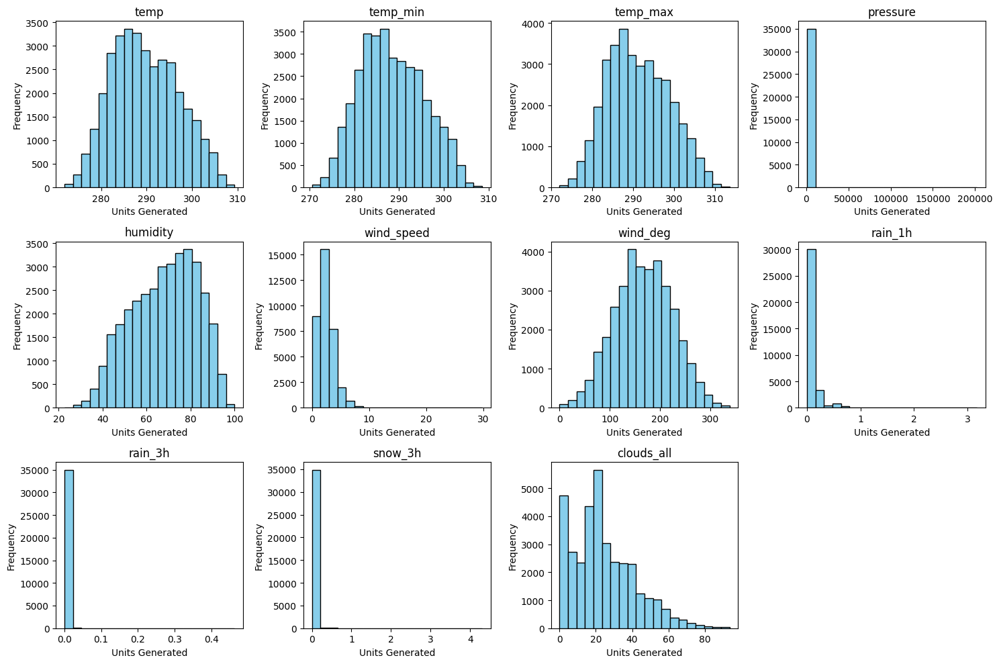

In [ ]:
###################################################
# Check the distributions of the weather features #
###################################################

import matplotlib.pyplot as plt

# Create a 3x4 subplot layout
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15, 10))
axes[-1, -1].axis('off') # We have only 11 variables but have 12 subplot grids. Need to mute the last one

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each column in the dataframe and create a plot for each one
for i, col in enumerate(df_final.iloc[:, 30:41]):
    axes[i].hist(df_final.iloc[:, 30:41][col], bins=20, color='skyblue', edgecolor='black')
    axes[i].set_title(f'{col}')
    axes[i].set_xlabel('Units Generated')
    axes[i].set_ylabel('Frequency')

# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()



Based on the histogram above, we can confirm our previous statement:

 Although some features in the dataset exhibit highly skewed distributions, the log transformation cannot be applied across the entire feature set. This is because several features contain zero values, and taking the logarithm of zero results in an undefined value.

#**2. Modeling the Actual Price**

###**2.1 Preliminary Process**

This section will deal with preliminary processing of the data and will split the data into the training and testing set. Additionally, this section will plot the distribution of the price

In [ ]:
# Drop unnecessary features: they are row number, but we already have the clean_pct
df_final = df_final.drop(columns = ['non-clean', 'clean'])

In [ ]:
# Because this is time-series data, we cannot simply do random split
train_df = df_final[~((df_final['year'] == 2018) & (df_final['month'].isin([7,  8,  9, 10, 11, 12])))]
test_df = df_final[((df_final['year'] == 2018) & (df_final['month'].isin([7,  8,  9, 10, 11, 12])))]

In [ ]:
# The training set's shape
train_df.shape

(30601, 39)

In [ ]:
# The testing set's shape
test_df.shape

(4416, 39)

<ipython-input-33-8e90d7898aed>:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




Text(0.5, 1.0, 'Distribution of the Actual Price')

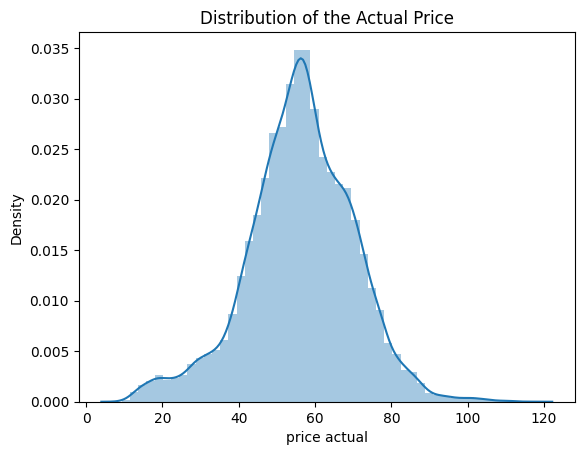

In [ ]:
########################################################
# Does the dependent variable needs to be transformed? #
########################################################
## No clear skewness, no need log transform
## Because there are many zeros in X, we dont' consider log transform for X, either
import matplotlib.pyplot as plt

sns.distplot(train_df['price actual'])
plt.title('Distribution of the Actual Price')

###**2.2 Correlation Analysis**

Check for the correlation between the top 15 features and the 'price actual'. The analysis will not consider all features to avoid problems with collinearity and overfitting. Furthermore, this section will generate a correlation heatmap using the correlation matrix.

In [ ]:
############################
# Correlation Study Part I #
############################
## Here we consider the top 15 features with the highest correlations with 'price actual'
## We don't consider all features to avoid collinearity and overfitting
Corr_lst = pd.Series(train_df.corr().abs()["price actual"].nlargest(15))
Corr_lst.name = 'Corr with Price Actual'
Corr_lst

price actual                                   1.000000
price day ahead                                0.716439
generation fossil hard coal                    0.512482
clean_pct                                      0.458677
generation fossil gas                          0.457949
total load forecast                            0.446295
total load actual                              0.444968
generation hydro pumped storage consumption    0.427995
generation fossil brown coal/lignite           0.408939
generation fossil oil                          0.343031
hour                                           0.291529
wind_speed                                     0.241015
forecast wind onshore day ahead                0.226073
qtr                                            0.223769
generation wind onshore                        0.223095
Name: Corr with Price Actual, dtype: float64

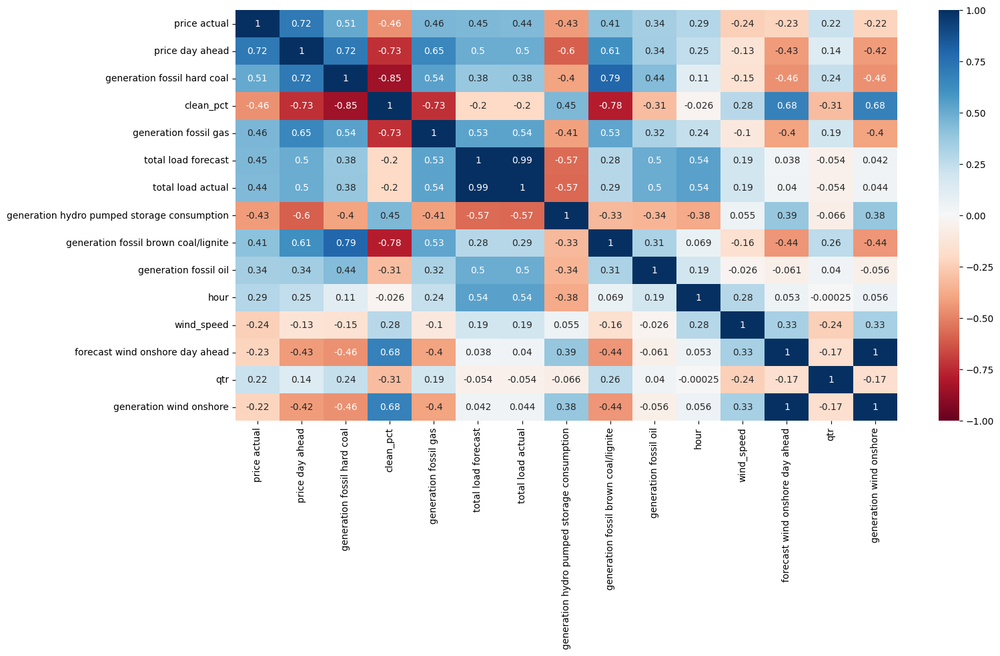

In [ ]:
#############################
# Correlation Study Part II #
#############################
## Heat map for correlation
import matplotlib.pyplot as plt

corr_mat = train_df[list(Corr_lst.index)].corr()
plt.figure(figsize=(16, 8))
sns.heatmap(data = corr_mat, vmin = -1, vmax = 1, cmap='RdBu', annot = True)
plt.show()

###**2.3 Linear Regression**

This section will perform a Linear Regression. Initialize a Linear regression model named reg with default parameters, fit the model to the training set, and then make predictions on the testing set. Furthermore, plot the number of features versus the resultant test RMSE. Lastly, fit the regression again and plot the fitting results which includes price actual, prediced price (training), and predicted price (testing).

In [ ]:
##################################
# Model 1: OLS Linear Regression #
##################################
## Number of features to be considered: 4 to 10

from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import mean_squared_error

y_train = train_df['price actual']
X_train_reg = train_df[list(Corr_lst.index)]
X_train_reg = X_train_reg.drop(columns = 'price actual')

y_test = test_df['price actual']
X_test_reg = test_df[list(Corr_lst.index)]
X_test_reg = X_test_reg.drop(columns = 'price actual')

reg = LinearRegression()

## Loop through 4 to 10 to select the optimal number of features based on test RMSE
## Feature selection using 'forward selection'
## with n = 7, the training R-sq is 0.607, the testing R-sq reaches the highest = 0.218, and the testing RMSE is the lowest = 7.1
## So we pick n = 7

train_RMSE = []
test_RMSE = []
selected_features = []
coefs = []
intercepts = []
def OLS_select_n_features (X_train_reg, y_train, X_test_reg, y_test, n):
  sfs = SequentialFeatureSelector(reg, n_features_to_select = n, direction = 'forward')
  sfs.fit(X_train_reg, y_train)
  OLS_features = X_train_reg.columns[sfs.get_support()]
  selected_features.append(OLS_features)

  X_train_reg = X_train_reg[OLS_features]
  X_test_reg = X_test_reg[OLS_features]

  reg_res = reg.fit(X_train_reg, y_train)
  lin_reg_score_train = reg.score(X_train_reg, y_train)
  lin_reg_score_test = reg.score(X_test_reg, y_test)

  coefs.append(reg_res.coef_)
  intercepts.append(reg_res.intercept_)

  #print("The selected features are: ")
  #print(list(OLS_features))
  print('Number of features: ' + str(n))
  print('Training R-sq: ' + str(np.round(lin_reg_score_train, 3)))
  print('Testing R-sq: ' + str(np.round(lin_reg_score_test, 3)))

  y_pred_train_reg = reg.predict(X_train_reg)
  y_pred_test_reg = reg.predict(X_test_reg)

  RMSE_train_reg = np.sqrt(mean_squared_error(y_train, y_pred_train_reg))
  RMSE_test_reg = np.sqrt(mean_squared_error(y_test, y_pred_test_reg))
  train_RMSE.append(RMSE_train_reg)
  test_RMSE.append(RMSE_test_reg)

  # Double check RMSE calculation using its definition
  #RMSE_train = np.sqrt(np.mean((y_pred_train - y_train) ** 2))
  #RMSE_test = np.sqrt(np.mean((y_pred_test - y_test) ** 2))

  print('RMSE training data: ' + str(np.round(RMSE_train_reg,1)))
  print('RMSE testing data: ' + str(np.round(RMSE_test_reg, 1)))
  print('')

for i in range(4, 11):
  OLS_select_n_features(X_train_reg, y_train, X_test_reg, y_test, i)


Number of features: 4
Training R-sq: 0.573
Testing R-sq: -0.227
RMSE training data: 9.2
RMSE testing data: 8.9

Number of features: 5
Training R-sq: 0.588
Testing R-sq: -0.005
RMSE training data: 9.0
RMSE testing data: 8.1

Number of features: 6
Training R-sq: 0.604
Testing R-sq: 0.206
RMSE training data: 8.8
RMSE testing data: 7.2

Number of features: 7
Training R-sq: 0.607
Testing R-sq: 0.218
RMSE training data: 8.8
RMSE testing data: 7.1

Number of features: 8
Training R-sq: 0.607
Testing R-sq: 0.211
RMSE training data: 8.8
RMSE testing data: 7.2

Number of features: 9
Training R-sq: 0.611
Testing R-sq: 0.182
RMSE training data: 8.8
RMSE testing data: 7.3

Number of features: 10
Training R-sq: 0.612
Testing R-sq: 0.181
RMSE training data: 8.8
RMSE testing data: 7.3



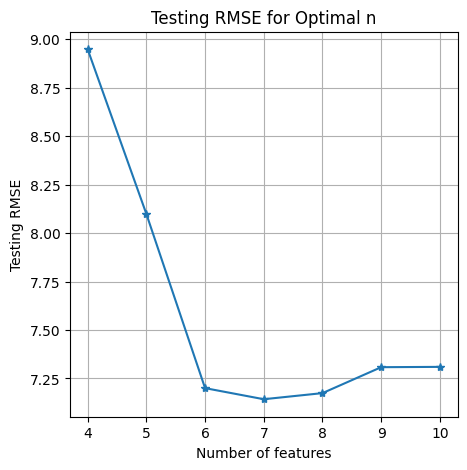

In [ ]:
# Plot the number of features vs. the resultant test RMSE
# As can be seen, lowest test RMSE occurs at n = 7
considered_n = pd.Series(range(4,11))
test_RMSE_out = pd.concat([considered_n, pd.Series(test_RMSE)], axis = 1)
test_RMSE_out.columns = ['n','test RMSE']
test_RMSE_out

plt.figure(figsize=(5, 5))
plt.plot(test_RMSE_out['n'], test_RMSE_out['test RMSE'], marker = "*")
plt.title('Testing RMSE for Optimal n')
plt.xlabel('Number of features')
plt.ylabel('Testing RMSE')
plt.xticks(test_RMSE_out['n'])
plt.grid(True)


In [ ]:
# Get parameter names
# We can see that, the feature we created to study the clean energy trend, which is 'clean_pct', is selected
# The 'clean_pct' indeed provides important information in price prediction
# Other features include self history (price day ahead), various time interval (hour, qtr), generation, and weahter (wind_speed)

optimal_n = test_RMSE_out['n'][test_RMSE_out['test RMSE'] == np.min(test_RMSE_out['test RMSE'])].astype('int')
param = list(selected_features[int(optimal_n.iloc[0]) - 4])
print(pd.Series(param))

0                                price day ahead
1                                      clean_pct
2    generation hydro pumped storage consumption
3                          generation fossil oil
4                                           hour
5                                     wind_speed
6                                            qtr
dtype: object


In [ ]:
# Output the training and test RMSE when n = 7
# Note that the test RMSE is even smaller than the training RMSE
RMSE_test_reg = test_RMSE[int(optimal_n.iloc[0]) - 4]
RMSE_train_reg = train_RMSE[int(optimal_n.iloc[0]) - 4]

print('OLS Regression RMSE Results:')
print('RMSE training data: ' + str(np.round(RMSE_train_reg, 2)))
print('RMSE testing data: ' + str(np.round(RMSE_test_reg, 2)))

OLS Regression RMSE Results:
RMSE training data: 8.81
RMSE testing data: 7.14


In [ ]:
#########################################################
# Fit the regression again and plot the fitting results #
#########################################################
X_train_reg = train_df[list(Corr_lst.index)]
X_train_reg = X_train_reg.drop(columns = 'price actual')
X_test_reg = test_df[list(Corr_lst.index)]
X_test_reg = X_test_reg.drop(columns = 'price actual')
reg = LinearRegression()

X_train_reg = X_train_reg[list(param)]
X_test_reg = X_test_reg[list(param)]

reg_res = reg.fit(X_train_reg, y_train)
lin_reg_score_train = reg.score(X_train_reg, y_train)
lin_reg_score_test = reg.score(X_test_reg, y_test)

y_pred_train_reg = reg.predict(X_train_reg)
y_pred_test_reg = reg.predict(X_test_reg)

y_pred_train_reg = pd.Series(y_pred_train_reg)
y_pred_test_reg = pd.Series(y_pred_test_reg)
y_pred_all = pd.concat([y_pred_train_reg, y_pred_test_reg], axis = 0)

all_t = pd.Series(list(range(0, len(y_pred_all))))
train_t = dates[list(range(0, len(y_pred_train_reg)))]
test_t = dates[list(range(len(y_pred_train_reg), len(y_pred_all)))]

fig3 = go.Figure()
fig3.add_trace(go.Line(x = dates, y = df_final['price actual'], name = 'price actual'))
fig3.add_trace(go.Line(x = train_t, y = y_pred_train_reg, name = 'predicted - training'))
fig3.add_trace(go.Line(x = test_t, y = y_pred_test_reg, name = 'predicted - testing'))
fig3.show()

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




We can see that, the in-sample (training) fitting looks okay, although the peak at early 2017 is not very well captured and the test fitting looks better. This can be due to the world economic effects of energy exportation mentioned earlier in the project that was not accounted for by our data. This is why we see that the test RMSE is even smaller than the training RMSE.

###**2.4 Random Forest Regression**

This section will use the RandomForestRegressor class in Scikit-learn's ensemble library to initialize a Random Forest regression model named reg_rf, fit the model to the training set, and then make predictions on the testing set. Lastly, plot the in-sample and out-sample fit which includes price actual, prediced price (training), and predicted price (testing).

In [ ]:
##################################################
# Model 2: Bagging with Random Forest Regression #
##################################################
from sklearn import ensemble

candid_df_train = train_df.drop(columns = ['price actual'])

seed = 2024
reg_rf = ensemble.RandomForestRegressor(random_state = seed)
reg_rf.fit(candid_df_train, y_train)

RandomForestRegressor(random_state=2024)

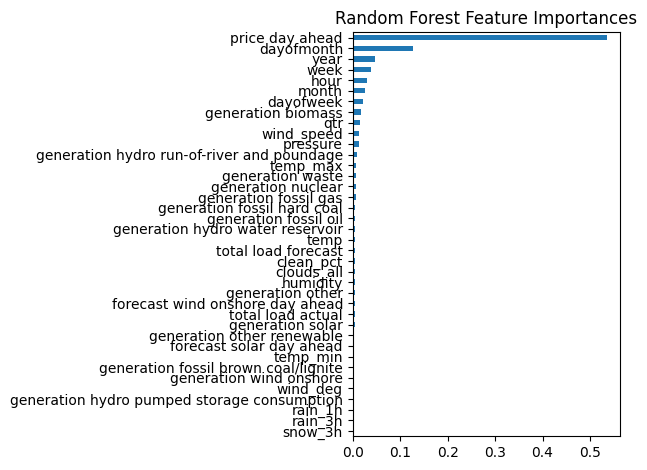

In [ ]:
# Get feature importances
#reg_rf.feature_names_in_
rf_imp = pd.Series(reg_rf.feature_importances_)
rf_imp.index = reg_rf.feature_names_in_

# Visualize feature importances
rf_imp_sort = rf_imp.sort_values(ascending = True)
ax = rf_imp_sort.plot.barh()
ax.set_title("Random Forest Feature Importances")
ax.figure.tight_layout()

In [ ]:
## We have tested n = 4 through to 10 manually because we don't need to re-do the whole fitting once we obtained the optimal n
## Surprisingly, best number is at n_feature = 5,
## Except 'price day ahead', the remaining features are all basically time interval variables that help capture the seasonality
rf_imp_sort = rf_imp.sort_values(ascending = False)
rf_n_features = 5
rf_selected_feature = rf_imp_sort[0:rf_n_features].index

X_train_rf = candid_df_train[rf_selected_feature]
X_test_rf = test_df[rf_selected_feature]

reg_rf_2 = ensemble.RandomForestRegressor(random_state = seed)
reg_rf_2.fit(X_train_rf, y_train)

RandomForestRegressor(random_state=2024)

In [ ]:
# Use the model to predict on the test set
rf_pred_train = reg_rf_2.predict(X_train_rf)
rf_pred_test = reg_rf_2.predict(X_test_rf)

# Find the R-squared score
rf_score_train = reg_rf_2.score(X_train_rf, y_train)
rf_score_test = reg_rf_2.score(X_test_rf, y_test)

In [ ]:
# Output the training and test R-sq

print(str(np.round(rf_score_train, 3)))
print(str(np.round(rf_score_test, 3)))

0.994
0.308


In [ ]:
# Output training and test RMSE
RMSE_rf_train = np.sqrt(mean_squared_error(y_train, rf_pred_train))
RMSE_rf_test = np.sqrt(mean_squared_error(y_test, rf_pred_test))

print('RMSE training data: ' + str(np.round(RMSE_rf_train, 2)))
print('RMSE testing data: ' + str(np.round(RMSE_rf_test, 2)))

## Conclusion:
## The training RMSE is very very small (1.07), but the test RMSE is relatively much larger (6.72). This shows that random forest does have the cons of overfitting.

RMSE training data: 1.07
RMSE testing data: 6.72


In [ ]:
## Plot the in-sample and out-sample fit

rf_pred_train = pd.Series(rf_pred_train)
rf_pred_test = pd.Series(rf_pred_test)
rf_pred_all = pd.concat([rf_pred_train, rf_pred_test], axis = 0)

all_t = pd.Series(list(range(0, len(rf_pred_all))))
train_t = dates[list(range(0, len(rf_pred_train)))]
test_t = dates[list(range(len(rf_pred_train), len(rf_pred_all)))]

fig4 = go.Figure()
fig4.add_trace(go.Line(x = dates, y = df_final['price actual'], name = 'price actual'))
fig4.add_trace(go.Line(x = train_t, y = rf_pred_train, name = 'predicted - training'))
fig4.add_trace(go.Line(x = test_t, y = rf_pred_test, name = 'predicted - testing'))
fig4.show()

## Conclusion:
# It is very obvious that the RF model suffers from overfitting. The in-sample fit looks great but the out-sample fit appears to be very poor

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




###**2.5 Gradient Boosting Regression**

This section will use the GradientBoostingRegressor class in Scikit-learn's ensemble library to initialize a Gradient Boosting regression model named reg_gbm, find and visualize feature importances, fit the model to the training set, and then make predictions on the testing set. Lastly, plot the in-sample and out-sample fit which includes price actual, prediced price (training), and predicted price (testing).

In [ ]:
#######################################################
# Model 3: Boosting with Gradient Boosting Regression #
#######################################################
from sklearn.ensemble import GradientBoostingRegressor

seed = 2024
reg_gbm = GradientBoostingRegressor(random_state=seed)
reg_gbm.fit(candid_df_train, y_train)

GradientBoostingRegressor(random_state=2024)

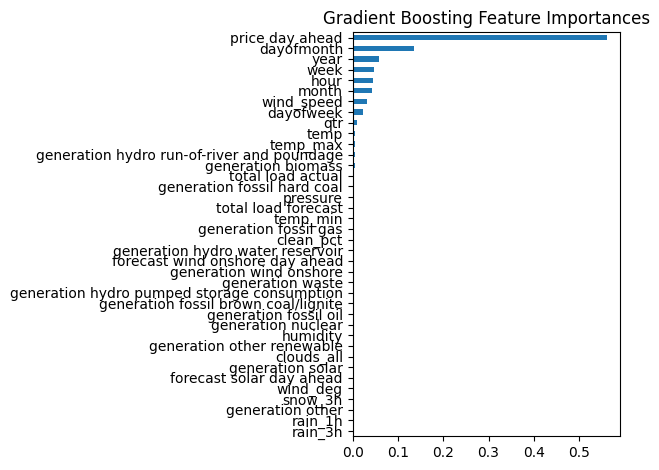

In [ ]:
# Get feature importances
gbm_imp = pd.Series(reg_gbm.feature_importances_)
gbm_imp.index = reg_gbm.feature_names_in_

# Visualize feature importances
gbm_imp_sort = gbm_imp.sort_values(ascending = True)
ax = gbm_imp_sort.plot.barh()
ax.set_title("Gradient Boosting Feature Importances")
ax.figure.tight_layout()

In [ ]:
## We have tested n = 4 through to 10 manually because we don't need to re-do the whole fitting once we obtained the optimal n
## We reach the samllest test RMSE by choosing best n_feature = 9
## The feature not only contain time interval information but also weather (wind_speed)
gbm_imp_sort = gbm_imp.sort_values(ascending = False)
gbm_n_features = 9
gbm_selected_feature = gbm_imp_sort[0:gbm_n_features].index

X_train_gbm = candid_df_train[gbm_selected_feature]
X_test_gbm = test_df[gbm_selected_feature]

reg_gbm_2 = GradientBoostingRegressor(random_state=seed, n_estimators = 120, learning_rate = 0.3)
reg_gbm_2.fit(X_train_gbm, y_train)

GradientBoostingRegressor(learning_rate=0.3, n_estimators=120,
                          random_state=2024)

In [ ]:
# Use the model to predict on the test set
gbm_pred_train = reg_gbm_2.predict(X_train_gbm)
gbm_pred_test = reg_gbm_2.predict(X_test_gbm)

# Find the R-squared score
gbm_score_train = reg_gbm_2.score(X_train_gbm, y_train)
gbm_score_test = reg_gbm_2.score(X_test_gbm, y_test)

In [ ]:
# Output the training and test R-sq
print(str(np.round(gbm_score_train, 3)))
print(str(np.round(gbm_score_test, 3)))

0.926
0.33


In [ ]:
# Output the training and test RMSE
RMSE_gbm_train = np.sqrt(mean_squared_error(y_train, gbm_pred_train))
RMSE_gbm_test = np.sqrt(mean_squared_error(y_test, gbm_pred_test))

print('RMSE training data: ' + str(np.round(RMSE_gbm_train, 2)))
print('RMSE testing data: ' + str(np.round(RMSE_gbm_test, 2)))

## Conclusion:
# We see some overfitting, but not as severe as Random Forest

RMSE training data: 3.82
RMSE testing data: 6.61


In [ ]:
## Plot the in-sample and out-sample fit

gbm_pred_train = pd.Series(gbm_pred_train)
gbm_pred_test = pd.Series(gbm_pred_test)
gbm_pred_all = pd.concat([gbm_pred_train, gbm_pred_test], axis = 0)

all_t = pd.Series(list(range(0, len(gbm_pred_all))))
train_t = dates[list(range(0, len(gbm_pred_train)))]
test_t = dates[list(range(len(gbm_pred_train), len(gbm_pred_all)))]

fig5 = go.Figure()
fig5.add_trace(go.Line(x = dates, y = df_final['price actual'], name = 'price actual'))
fig5.add_trace(go.Line(x = train_t, y = gbm_pred_train, name = 'predicted - training'))
fig5.add_trace(go.Line(x = test_t, y = gbm_pred_test, name = 'predicted - testing'))
fig5.show()

## Conclusion:
# Similar to the RF model, GBM suffers a bit from overfitting. The in-sample fit looks great but the out-sample fit appears to be a bit off. The up-and-down pattern was not well captured

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




##**3. The Presence of Intertemporal Dependence -- ARIMA Model**

This section will deal with an additional model, time series modeling using ARIMA (selecting the basic model AR = 1 and MA = 1 with exogenous variables) and will plot the autocorrection and partial autocorrection.




In [ ]:
###############################################################################
# Additional Model: Time series modeling using ARIMA with exogenous variables #
###############################################################################
## Inspired by the fact we found: the history variable 'price day ahead' is the most important feature. So, there must be an intertemporal dependency in the actual price

# Checking stationarity with ADF test
# p-value is small so reject H0: unit root (non-stationarity)
# No differencing is needed.
from statsmodels.tsa.stattools import adfuller
from pandas import Series

dftest = adfuller(y_train, autolag='AIC')
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags', 'Observations'])

for key,value in dftest[4].items():
  dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Test Statistic         -9.101345e+00
p-value                 3.598646e-15
#Lags                   5.000000e+01
Observations            3.055000e+04
Critical Value (1%)    -3.430564e+00
Critical Value (5%)    -2.861635e+00
Critical Value (10%)   -2.566820e+00
dtype: float64


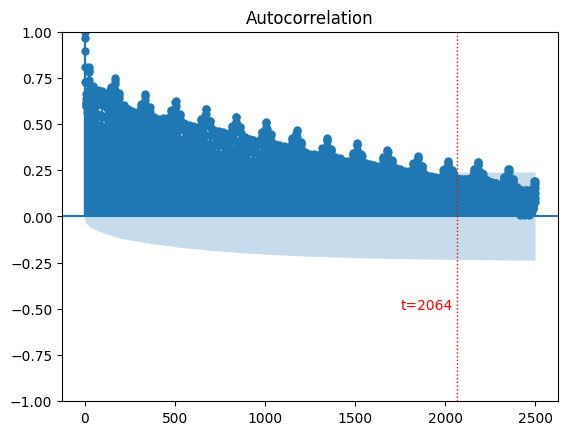

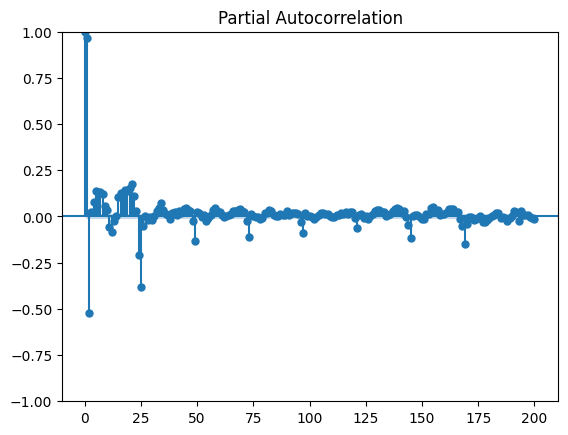

In [ ]:
## Plot ACF and PACF
## The decaying pattern in both ACF and PACF suggests an ARMA model
## We can see that the autocorrelation is siginificant until 2000 ~ 2100 periods (the red line is at 2064 hrs = 86 days ~ 1 qtr), showing that the intertemporal dependence can last for a quarter
## This explains why 'qtr' as a feature is of top 10 importance features for RF and GBM
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

acf = plot_acf(y_train, lags=2500)
plt.axvline(2064, color='r', linewidth = 1, linestyle = ':') # vertical red line at x = 2064
plt.text(1750, -0.5, 't=2064', fontsize = 10, color = 'r')
pacf = plot_pacf(y_train, lags=200)

In [ ]:
# We choose the basic model AR = 1, MA = 1, with exogenous regressors
# We can see that both AR and MA terms are significant
# Given the ARMA structure, wind_speed becomes insignificant

from statsmodels.tsa.arima.model import ARIMA

arima_mod = ARIMA(y_train, exog = X_train_reg[['price day ahead', 'clean_pct', 'generation fossil oil', 'hour', 'qtr']], order=(1, 0, 1)) # d = 0 because of no differencing
res = arima_mod.fit()
print(res.summary())

## Conclusion:
# The significances of AR and MA terms confirm that the actual price has a temporal structure

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:           price actual   No. Observations:                30601
Model:                 ARIMA(1, 0, 1)   Log Likelihood              -72076.825
Date:                Sat, 27 Apr 2024   AIC                         144171.650
Time:                        18:57:27   BIC                         144246.609
Sample:                             0   HQIC                        144195.679
                              - 30601                                         
Covariance Type:                  opg                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -8.3614      0.522    -16.019      0.000      -9.384      -7.338
price day ahead           0.6659      0.003    266.320      0.000       0.661       0.671
clean_pc

In [ ]:
# Forecast
ARIMA_fcst_train = res.predict()
RMSE_train_ARIMA = np.sqrt(mean_squared_error(y_train, ARIMA_fcst_train))

## We shouldn't do 4.4k step ahead forecast. the result is very off. This is only for practice purpose
ARIMA_fcst_test = res.forecast(steps = len(y_test), exog = X_test_reg[['price day ahead', 'clean_pct', 'generation fossil oil', 'hour', 'qtr']])
#RMSE_test_ARIMA = np.sqrt(mean_squared_error(y_test, ARIMA_fcst_test))

print(np.round(RMSE_train_ARIMA, 2))
#print(np.round(RMSE_test_ARIMA, 2))

## Conclustion:
# As can be seen, with AR and MA specification, the in-sample fit in terms of RMSE is greatly improved from 8.81 to 2.55
# The out-of-sample prediction should be conducted in a rolling one-step ahead manner, but it is very time-consuming, so we didn't do it

2.55


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



#**4. Conclusion**

I. Clean Energy Trend

While decarbonization has been getting more attention, we didn't see a clear trend in the utilization of clean energy from the Spain data.

II. Modeling and Prediction of Energy Price
1. The most important feature to predict energy price is 'price day ahead'. The dependency upon history indicates temporal structures in it.
2. The energy price appears to be quite cyclic, and hence the time interval variables (qtr, day of month, etc) are important features.
3. Summary of the comparative study on the machine learning regression models:

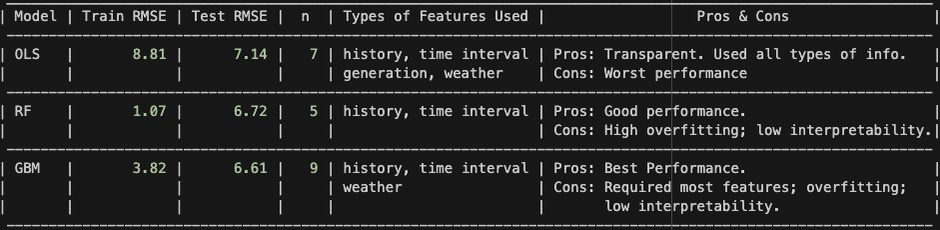

III. Time Series Modeling with ARIMA
1. Inspired by the observed dependency upon past history, an ARIMA model is fitted to describe the temporal structures in the energy price.
2. The out-of-sample prediction should be conducted in a rolling one-step ahead manner, but it is very time-consuming, so we didn't do it.
3. With the AR and MA specification, the in-sample fit in terms of RMSE is greatly improved from 8.81 to 2.55.

In [ ]:
############################
# Conclusion (please keep) #
############################
# ______________________________________________________________________________________________________________
#| Model | Train RMSE | Test RMSE |  n  | Types of Features Used |                  Pros & Cons                 |
# --------------------------------------------------------------------------------------------------------------
#| OLS   |       8.81 |      7.14 |   7 | history, time interval | Pros: Transparent. Used all types of info.   |
#|       |            |           |     | generation, weather    | Cons: Worst performance                      |
# --------------------------------------------------------------------------------------------------------------
#| RF    |       1.07 |      6.72 |   5 | history, time interval | Pros: Good performance.                      |
#|       |            |           |     |                        | Cons: High overfitting; low interpretability.|
# --------------------------------------------------------------------------------------------------------------
#| GBM   |       3.82 |      6.61 |   9 | history, time interval | Pros: Best Performance.                      |
#|       |            |           |     | weather                | Cons: Required most features; overfitting;   |
#|       |            |           |     |                        |       low interpretability.                  |
# --------------------------------------------------------------------------------------------------------------

#**5. The Challenges**

During the development of the project, several challenges were encountered in both the data preparation and modeling phases. The first obstacle in processing the data was determining how to utilize the categorical features. Although these categorical columns provided useful weather information in text format, we ultimately decided to discard them for two reasons. First, including them would inevitably produce duplicate records, as there can be multiple weather conditions within a single hourly record. For instance, two weather types, 'drizzle' and 'mist', occurred within the same hour (2018-04-29 10:00) in Madrid, causing duplication for that particular record. Second, we believed that the numerical weather features already provided similar information. The assessment of the categorical columns was detailed in the third code block of Section 1.3.

<br>

The second obstacle was determining how to appropriately create the modeling data frame. Since the energy production features are the same across all five main cities and the only variation lies in the weather features, simply combining the energy production and weather data would result in a stack of the five cities' data frames with repeated records for the energy production features. To tackle this issue, we averaged the weather features over the five cities to create aggregated information about the weather. This process was detailed in the 11th to 13th code blocks of Section 1.3.

<br>

The challenge faced in the modeling stage was the trade-off between interpretability and performance. In the linear regression output, the coefficient for 'clean_pct' was positive, but its correlation coefficient was negative. This inconsistency indicates the presence of multicollinearity. However, removing the correlated features would reduce the model's performance in terms of test RMSE. Consequently, we decided to retain all the correlated features. This decision highlights another key takeaway from this project. Unlike other mainstream statistical software packages like R and SAS, Python's sklearn package does not report t-statistics and p-values, which are useful quantities for assessing feature significance and model interpretability. It appears that the package is more performance-oriented.


#**6. Future Directions**
A potential future direction for this project is to complete the development of the ARIMA model. In the current project, we fitted an ARIMA (1,0,1) model but did not evaluate its predictive performance. Testing the model's performance would require multiple one-step ahead forecasts and re-fitting the model, which can be a time-consuming process. Exploring this direction further could provide insights into the effectiveness of the ARIMA model for this particular dataset and problem.

<br>

Another promising future direction is to apply more advanced and modern machine learning techniques to the dataset. Deep neural networks (DNN) and long short-term memory (LSTM) models are powerful tools that have shown impressive results in various domains, including time series forecasting. Implementing these techniques could potentially lead to better performance compared to the models used in this project. By leveraging the ability of DNNs and LSTMs to capture complex patterns and relationships in the data, we may be able to improve the accuracy of our predictions and gain deeper insights into the underlying factors influencing energy production.

<br>

Pursuing these future directions would not only enhance the current project but also contribute to the broader field of energy production forecasting!